## Проект - "Предсказание стоимости жилья"

**Задачи**<br>
* Обучить модель линейной регрессии на данных о жилье в Калифорнии в 1990 году. На основе данных нужно предсказать медианную стоимость дома в жилом массиве.
* Сделать предсказания на тестовой выборке.
* Оценить качество модели используя метрики - `RMSE`, `MAE` и `R2`.

**Данные**<br>
`longitude` — широта<br>
`latitude` — долгота<br>
`housing_median_age` — медианный возраст жителей жилого массива<br>
`total_rooms` — общее количество комнат в домах жилого массива<br>
`total_bedrooms` — общее количество спален в домах жилого массива<br>
`population` — количество человек, которые проживают в жилом массиве<br>
`households` — количество домовладений в жилом массиве<br>
`median_income` — медианный доход жителей жилого массива<br>
`median_house_value` — медианная стоимость дома в жилом массиве<br>
`ocean_proximity` — близость к океану<br>

## Импорт библиотек

In [1]:
import pandas as pd
import numpy as np

#import pyspark.pandas as p_p

import pyspark
import pyspark.sql.functions as F
from pyspark.sql.functions import col, when, abs

import seaborn as sns
import matplotlib.pyplot as plt

from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.ml.regression import LinearRegression
from pyspark.ml.feature import (
                                OneHotEncoder,
                                Imputer,
                                StringIndexer,
                                VectorAssembler,
                                StandardScaler
                               )

from pyspark.ml.stat import Correlation
from pyspark.mllib.evaluation import RegressionMetrics


In [2]:
RANDOM_SEED = 2022

class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

bold_start = color.BLUE
bold_end   = color.END

#pd.reset_option
#pd.set_option("display.max_columns", None)
#pd.set_option('display.max_rows', 20)
#pd.options.display.float_format = '{:,.2f}'.format

## Функции

### `df_info` - информация о датасете

In [3]:
def df_info(
    df_,
    printSchema_ = True,
    show_columns_ = [],
    check_null_columns_ = []
):
    print(
        bold_start,'------------------------------------------------------------------------------------------------',bold_end
    )
    if printSchema_:
        print(bold_start,'Структура.',bold_end)
        print('')
        df_.printSchema()
        print(pd.DataFrame(df_.dtypes, columns = ['column', 'type']))
        print('')
    
    print(bold_start,'Данные.',bold_end)
    print('')
    display(pd.DataFrame(df_.take(3), columns = df_.columns))
    
    if show_columns_ != []:
        df_.select(show_columns_).show(3)
    print('')

    if check_null_columns_ != []:
        print(bold_start,'Количество пропусков:',bold_end)
        print('')
        for column in check_null_columns_:
            filter_srtr = column + ' is NULL'
            print(column, '-', df_.filter(filter_srtr).count())

    print('Количество явных дубликатов - ', df_housing_.count() - df_housing_.dropDuplicates(df_housing_.columns).count())

### `column_analiser` - информация о числовом поле

In [4]:
def column_analiser(
    df_,
    column_,
    x_label='',
    y_label='',
    print_unique = False,
    bins_= 70,
    figsize_ = (15, 10),
    height_ratios_ = [1, 3],
    hue_ = '',
    kde_plot_log_flag_ = True,
    kde_plot_figsize_ = (15, 10),
    kde_plot_title = '',
    kde_plot_x_label = '',
    kde_plot_y_label = '',
    sns_point_size_coefficient_ = 0,
    column_abs_ = ''
):
    
    print(
        bold_start,'------------------------------------------------------------------------------------------------',bold_end
    )
    print(bold_start,f'Поле : {column_} - {x_label}',bold_end)
    print('')
    
    print(df_[column_].describe())
    if print_unique:
        print(bold_start,'Список значений',bold_end)
        print(df_[column_].unique())
        
    fig, axes = plt.subplots(nrows = 2, ncols = 1, figsize = figsize_, gridspec_kw={'height_ratios': height_ratios_})
        
    axes[0] = df_[column_].plot(
        kind = 'box',
        ax = axes[0],
        vert=False)
    axes[0].set_ylabel(y_label)

    axes[1] = plt.hist(
        df_[column_],
        bins=bins_,
    )
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title('Распределение')
    plt.show()    
    
    if hue_ != '':
        if kde_plot_log_flag_:
            fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = kde_plot_figsize_)
            sns.kdeplot(data = df_,
                        x = np.log1p(df_[column_]),
                        hue = hue_,
                        fill = True)
            kde_plot_x_label = kde_plot_x_label + ' (Log)'
        else:
            fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = kde_plot_figsize_)
            sns.kdeplot(data = df_,
                        x = df_[column_],
                        hue = hue_,
                        fill = True)
            
        plt.title(kde_plot_title)
        plt.xlabel(kde_plot_x_label)
        plt.ylabel(kde_plot_y_label)
        plt.show()
    
    if sns_point_size_coefficient_ != 0:
        plt.figure(figsize=[30, 25])
        
        if column_abs_ == '':
            column_abs_ = column_
            
        gfg = sns.scatterplot(
            x = 'longitude',
            s = df_[column_abs_] / sns_point_size_coefficient_,
            y = 'latitude', 
            data = df_,
            palette = 'bright',
            hue='ocean_proximity'); # подсвечивает указанную категорию другим цветом

        gfg.set_xlabel('Широта', fontsize = 25)
        gfg.set_ylabel('Долгота', fontsize = 25)
        gfg.tick_params(axis='both', labelsize=20)
        title_str = 'Распределение ' + column_abs_ + ' (' + x_label + ')'
        gfg.set_title(title_str, fontdict = {'fontsize': 30, 'verticalalignment': 'top'}) 
        
        plt.setp(gfg.get_legend().get_texts(), fontsize='20')
        plt.setp(gfg.get_legend().get_title(), fontsize='25')
        plt.show()

### `categorical_property_visualization` - информация о категориальном поле

In [5]:
def categorical_property_visualization(
    data_,
    indexes_=[],
    titles_=[],
    values_='',
    aggfunc_='count',
    nrows_=2,
    ncols_=3,
    figsize_=(20, 7),
    title_ = '',
    y_title_ = 1
):
    
    columns = data_.columns
    
    row_ind = 0
    col_ind = 0
    subplot_ind = 0
    
    if nrows_ * ncols_ < len(indexes_):
        print(Несоответствие - nrows_ * ncols_ < len(indexes_))
        return

    fig, axes = plt.subplots(nrows=nrows_, ncols=ncols_, figsize=figsize_)
    fig.suptitle(title_, fontsize=20, y = y_title_)

    for x in axes.ravel():
        x.axis("off")    
        #print(row_ind, col_ind)
        #print(len(axes.shape))

    for ind in indexes_:
        if len(axes.shape) == 1:
            current_ax = axes[subplot_ind]
        else:
            current_ax = axes[row_ind, col_ind]
            
#        current_ax.set_visible(False)
        
        for_plot_df = data_.pivot_table(
                index=ind,
#                values=values_,
                values=values_,
                aggfunc=aggfunc_
            )
        for_plot_df.columns = ['count']
#        display(for_plot_df)
        for_plot_df.plot(
                kind='pie',
                ax = current_ax,
                #y='id',
                y='count',
                autopct='%1.0f%%'
            )
        #axes[row_ind, col_ind].set_title(titles[subplot_ind])
        #axes[row_ind, col_ind].get_legend().remove()
        current_ax.set_title(titles[subplot_ind])
        current_ax.get_legend().remove()
        
    
        subplot_ind += 1
        col_ind += 1
        if col_ind == ncols_: #3
            col_ind = 0
            row_ind += 1

### `cat_column_coder` - кодировщик категориальных полей

In [6]:
def cat_column_coder(
        df_,
        inputCol_ = 'ocean_proximity',
        output_Col_index_ = 'ocean_proximity_index',
        output_Col_ohe_ = 'ocean_proximity_ohe',
        output_Col_Assembler = 'categorical_features'):

    indexer = StringIndexer(inputCol = inputCol_,
                            outputCol = output_Col_index_,
                           handleInvalid = 'skip')
    df_ = indexer.fit(df_).transform(df_)

    encoder = OneHotEncoder(inputCols = [output_Col_index_],
                            outputCols = [output_Col_ohe_])
    model_ohe = encoder.fit(df_)
    df_ = model_ohe.transform(df_)
    
    categorical_assembler = VectorAssembler(
    inputCols=[output_Col_ohe_],
    outputCol = output_Col_Assembler)

    df_ = categorical_assembler.transform(df_)
    
    return df_

### `num_column_coder` - кодировщик числовых полей

In [7]:
def num_column_coder(
    df_,
    num_columns_ = [],
    output_col_ = 'num_features',
    output_col_scaled_ = 'num_features_scaled'):

    num_assembler = VectorAssembler(
        inputCols = num_columns_,
        outputCol = output_col_)

    df_ = num_assembler.transform(df_)

    standardScaler = StandardScaler(
        inputCol = output_col_,
        outputCol = output_col_scaled_
    )

    df_ = standardScaler.fit(df_).transform(df_)
    
    return df_

### `heatmap_draw` - визуализация матрицы корреляции

In [8]:
def heatmap_draw(df_, num_columns_, target_column_):
    corr_columns = []
    corr_columns.extend(num_columns_) 
    corr_columns.append(target_column_)

    vector_columns = 'corr_features'

    assembler = VectorAssembler(inputCols = corr_columns, outputCol = vector_columns)
    df_vector = assembler.setHandleInvalid("skip").transform(df_[corr_columns]).select(vector_columns)
    df_vector = assembler.transform(df_[corr_columns]).select(vector_columns)

    matrix = Correlation.corr(df_vector, vector_columns)
    cor_np = matrix.collect()[0][matrix.columns[0]].toArray()

    matrix_df = pd.DataFrame(cor_np, columns = corr_columns)
    matrix_df.index = corr_columns

    plt.suptitle('Матрица корреляции phi(k) обучающая выборка)')
    plt.figure(figsize = (12, 10))
    sns.heatmap(matrix_df,
               annot=True,
                  vmin=-1,
                   vmax=1,
          cmap='coolwarm')

## Подготовка данных

### Загрузка данных

In [9]:
sp_session = SparkSession.builder \
                    .master("local") \
                    .appName("California Housing") \
                    .getOrCreate()


In [10]:
df_housing_ = sp_session.read.load('/datasets/housing.csv',
                                        format='csv',
                                             sep=',',
                                    inferSchema=True,
                                         header=True)

In [11]:
# df_housing_ содержит оригинальные данные. Дальнейшая работа проводиться по df_housing.
# Такая реализация позволяет не перечитывать данные после трансформации в процессе отладки отладке.

df_housing = df_housing_

In [12]:
# Структура данных, пример записей, проверка пропусков
df_info(
    df_housing,
    printSchema_ = True,
    show_columns_ = [],
    check_null_columns_ = df_housing.columns)

 ------------------------------------------------------------------------------------------------ 
 Структура. 

root
 |-- longitude: double (nullable = true)
 |-- latitude: double (nullable = true)
 |-- housing_median_age: double (nullable = true)
 |-- total_rooms: double (nullable = true)
 |-- total_bedrooms: double (nullable = true)
 |-- population: double (nullable = true)
 |-- households: double (nullable = true)
 |-- median_income: double (nullable = true)
 |-- median_house_value: double (nullable = true)
 |-- ocean_proximity: string (nullable = true)

               column    type
0           longitude  double
1            latitude  double
2  housing_median_age  double
3         total_rooms  double
4      total_bedrooms  double
5          population  double
6          households  double
7       median_income  double
8  median_house_value  double
9     ocean_proximity  string

 Данные. 



,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY



 Количество пропусков: 



longitude - 0
latitude - 0
housing_median_age - 0
total_rooms - 0
total_bedrooms - 207
population - 0
households - 0
median_income - 0
median_house_value - 0
ocean_proximity - 0


Количество явных дубликатов -  0


### Заполнение пропусков

In [13]:
total_bedrooms_mean = df_housing.filter('total_bedrooms is not NULL').count()

print('Значение медианы поля total_bedrooms (total_bedrooms_mean) - ', total_bedrooms_mean) 
print(
    'Количество записей, в которых значение total_rooms < total_bedrooms_mean - ',
    df_housing.filter(col('total_rooms') < total_bedrooms_mean).count())

Значение медианы поля total_bedrooms (total_bedrooms_mean) -  20433
Количество записей, в которых значение total_rooms < total_bedrooms_mean -  20612


In [14]:
# Отношение количества комнат к количесту спален по набору данных, где total_bedrooms is not NULL
rooms_count = df_housing.select('total_rooms','total_bedrooms').filter('total_bedrooms is not NULL') \
    .toPandas()['total_rooms'].sum()
print('rooms_count - ', rooms_count)

bedrooms_count = df_housing.select('total_rooms','total_bedrooms').filter('total_bedrooms is not NULL') \
    .toPandas()['total_bedrooms'].sum()
print('bedrooms_count - ', bedrooms_count)

bedrooms_rooms_ratio = bedrooms_count/rooms_count

print('Отношение bedrooms_count/rooms_count - ', bedrooms_rooms_ratio)

rooms_count -  53871691.0
bedrooms_count -  10990309.0
Отношение bedrooms_count/rooms_count -  0.20400898497877112


In [15]:
# Формирование поля total_bedrooms_out с заполнение пустых значений total_bedrooms = total_rooms * bedrooms_rooms_ratio

df_housing = df_housing.withColumn(
    'total_bedrooms_out',
    when(
        col('total_bedrooms').isNull(),
        col('total_rooms') * bedrooms_rooms_ratio
    ).otherwise(col('total_bedrooms'))
)

In [16]:
# Проверка на разумное количество спален. Записей где total_rooms < total_bedrooms_out нет
df_housing.select('total_rooms','total_bedrooms', 'total_bedrooms_out').filter('total_rooms < total_bedrooms_out').show()

+-----------+--------------+------------------+
|total_rooms|total_bedrooms|total_bedrooms_out|
+-----------+--------------+------------------+
+-----------+--------------+------------------+



### Анализ целесообразности агрегации

In [17]:
columns_df_housing = [
'longitude',
'latitude',
'housing_median_age',
'total_rooms',
'population',
'households',
'median_income',
'median_house_value',
'ocean_proximity',
'total_bedrooms_out'
]

columns_for_group = [
'longitude',
'latitude',
'housing_median_age',
'median_income',
'median_house_value',
'ocean_proximity'
]

columns_for_agg = [val for val in columns_df_housing if val not in columns_for_group]

print('Список полей df_housing:')
display(columns_df_housing)
print('----------------------------------------------------------------------')
print('Список полей группировки:')
display(columns_for_group)
print('----------------------------------------------------------------------')
print('Список полей агрегации:')
display(columns_for_agg)

Список полей df_housing:


['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'population',
 'households',
 'median_income',
 'median_house_value',
 'ocean_proximity',
 'total_bedrooms_out']

----------------------------------------------------------------------
Список полей группировки:


['longitude',
 'latitude',
 'housing_median_age',
 'median_income',
 'median_house_value',
 'ocean_proximity']

----------------------------------------------------------------------
Список полей агрегации:


['total_rooms', 'population', 'households', 'total_bedrooms_out']

In [18]:
print('Количество записей в df_housing - ', df_housing.count())
print('Количество дубликатов по полям группировки - ', df_housing.count() - df_housing.dropDuplicates(columns_for_group).count())

#display(df_housing_.dropDuplicates(columns).toPandas())
df_housing.groupby(columns_for_group) \
    .count() \
    .where('count > 1') \
    .sort('count', ascending=False) \
    .show()

Количество записей в df_housing -  20640


Количество дубликатов по полям группировки -  2


+---------+--------+------------------+-------------+------------------+---------------+-----+
|longitude|latitude|housing_median_age|median_income|median_house_value|ocean_proximity|count|
+---------+--------+------------------+-------------+------------------+---------------+-----+
|  -118.33|   34.07|              52.0|      15.0001|          500001.0|      <1H OCEAN|    2|
|  -118.41|   34.07|              52.0|      15.0001|          500001.0|      <1H OCEAN|    2|
+---------+--------+------------------+-------------+------------------+---------------+-----+



### Формирование искуственных признаков

In [19]:
# Отношение количества комнат total_rooms к количеству домовладений households
df_housing = df_housing.withColumn('rooms_households_ratio', F.col('total_rooms')/F.col('households'))

# Отношение количества жителей population к количеству домовладений households
df_housing = df_housing.withColumn('population_households_ratio', F.col('population')/F.col('households'))

# Отношение количества спален total_bedrooms к общему количеству комнат total_rooms
df_housing = df_housing.withColumn('bedrooms_rooms_ratio', F.col('total_bedrooms_out')/F.col('total_rooms'))

### **Выводы**

* Данные загружены успешно
* Структура соответствует описанию
* Обнаружены пропуски в колонке `total_bedrooms`
    * Заполнении пропусков `total_bedrooms` медианным значением нецелесообразно, т.к. 20612 записях значение `total_rooms < total_bedrooms_mean`, что является аномалией.
    * Для заполнения пропусков в `total_bedrooms` был расчитано значение отношения общего количества комнат к общему количеству спален - `bedrooms_rooms_ratio` (по записям с заполненным значением `total_bedrooms`).
    * Пустые значения `total_bedrooms` заполнены значением произведения `total_bedrooms` и `bedrooms_rooms_ratio`
* Сформированы дополнительные признаки:
    * `rooms_households_ratio` - отношение количества комнат total_rooms к количеству домовладений households
    * `population_households_ratio` - отношение количества жителей population к количеству домовладений households
    * `bedrooms_rooms_ratio` - отношение количества спален total_bedrooms к общему количеству комнат total_rooms

## Исследовательский анализ

In [20]:
analised_df = df_housing.toPandas()
#analised_df = df_housing.to_pandas_on_spark()
#analised_df.head(2)

### Признак `ocean_proximity` - Удаленность от океана

,ocean_proximity,count
0,ISLAND,5
1,NEAR OCEAN,2658
2,NEAR BAY,2290
3,<1H OCEAN,9136
4,INLAND,6551


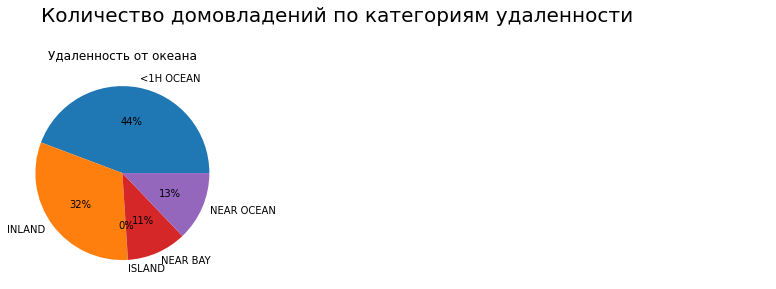

In [21]:
indexes = ['ocean_proximity']

titles = ['Удаленность от океана']
categorical_property_visualization(
    data_= analised_df,
    indexes_= indexes,
    titles_= titles,
    values_='median_income',
    aggfunc_='count',
    title_ = 'Количество домовладений по категориям удаленности',
    figsize_=(15, 4),
    nrows_= 1,
    ncols_= 2,
    y_title_ = 1.08)

display(df_housing.groupBy('ocean_proximity').count().toPandas())

### Числовые признаки

In [22]:
column_lst = [
    'median_house_value',
    'rooms_households_ratio',
    'population_households_ratio',
    'bedrooms_rooms_ratio',

    'housing_median_age',
    'total_rooms',
    'total_bedrooms_out', #'total_bedrooms',
    'population',
    'households',
    'median_income',
    'longitude',
    'latitude'
    ]

title = [
    'медианная стоимость дома в жилом массиве',
    'Отношение количества комнат к количеству домовладений',
    'Отношение количества жителей к количеству домовладений',
    'Отношение количества спален к общему количеству комнат',

    'медианный возраст домов',
    'общее количество комнат в домах жилого массива',
    'общее количество спален в домах жилого массива',
    'количество человек, которые проживают в жилом массиве',
    'количество домовладений в жилом массиве',
    'медианный доход жителей жилого массива',
    'широта',
    'долгота'
]

kde_plot_log_flag = [
    False,
    True,
    True,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False
]

sns_point_size_coefficient = [
    1500,
    0.02,
    0.01,
    0.001,
    0.1,
    10,
    1,
    10,
    1,
    0.008,
    0,
    0
]

 ------------------------------------------------------------------------------------------------ 
 Поле : median_house_value - медианная стоимость дома в жилом массиве 

count     20640.000000
mean     206855.816909
std      115395.615874
min       14999.000000
25%      119600.000000
50%      179700.000000
75%      264725.000000
max      500001.000000
Name: median_house_value, dtype: float64


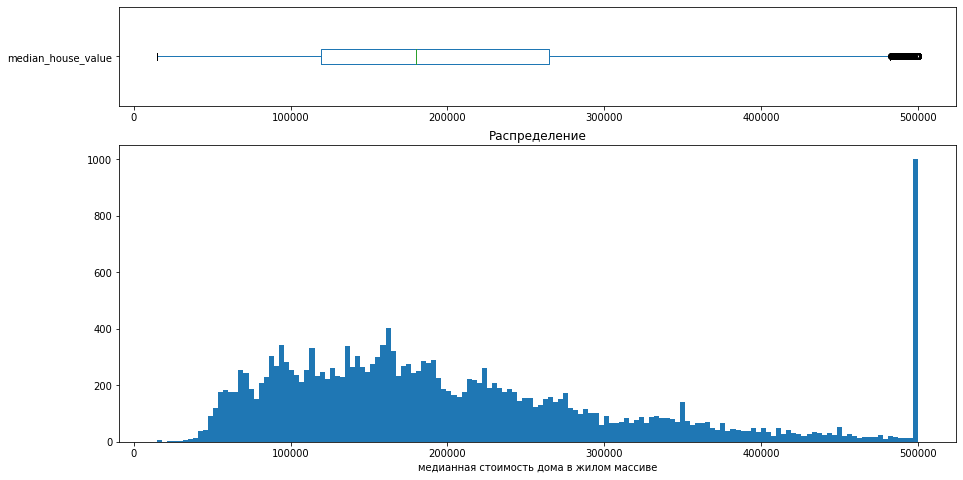

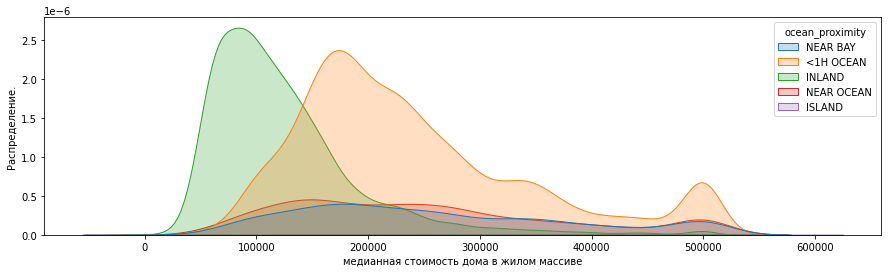

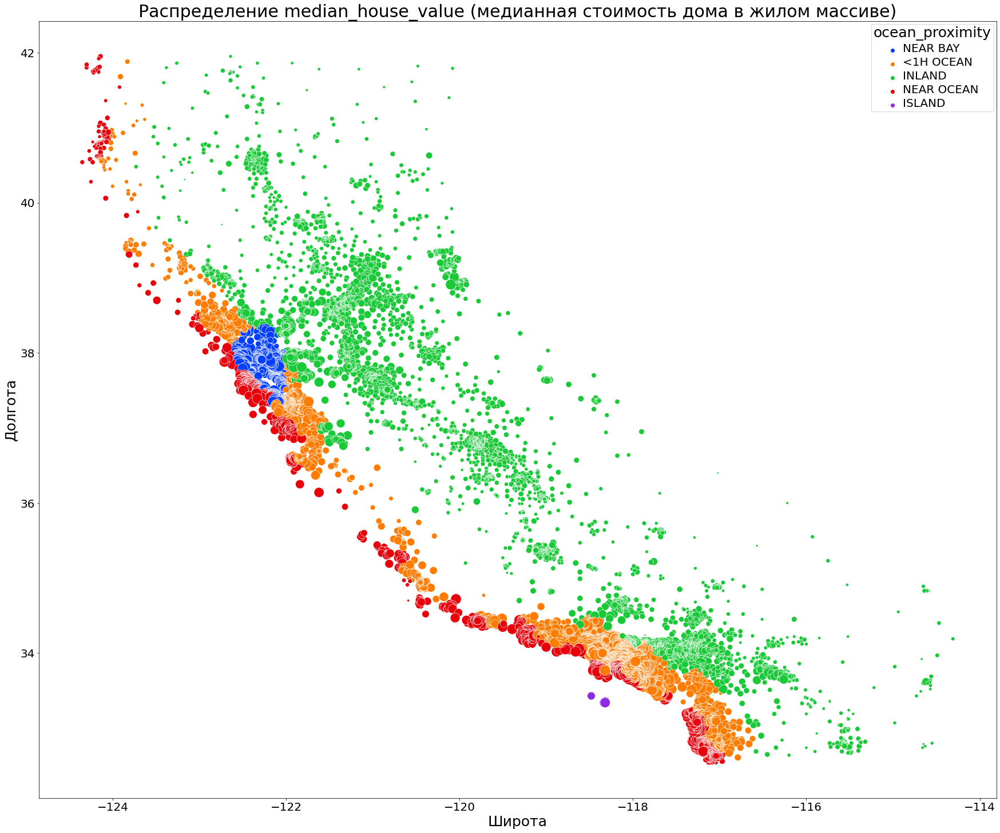

 ------------------------------------------------------------------------------------------------ 
 Поле : rooms_households_ratio - Отношение количества комнат к количеству домовладений 

count    20640.000000
mean         5.429000
std          2.474173
min          0.846154
25%          4.440716
50%          5.229129
75%          6.052381
max        141.909091
Name: rooms_households_ratio, dtype: float64


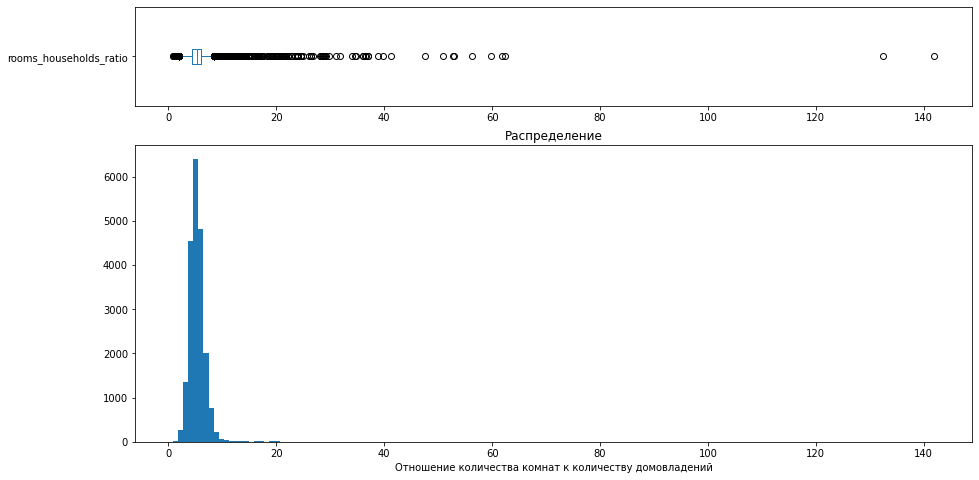

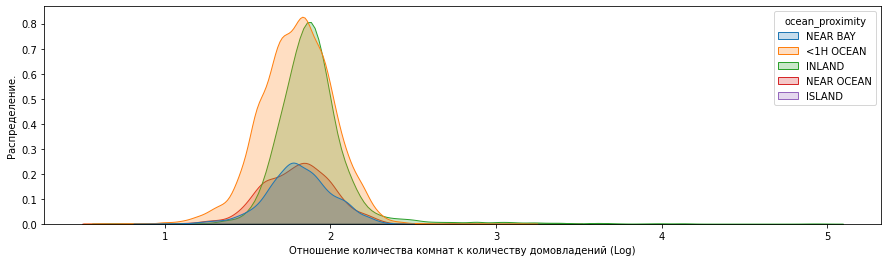

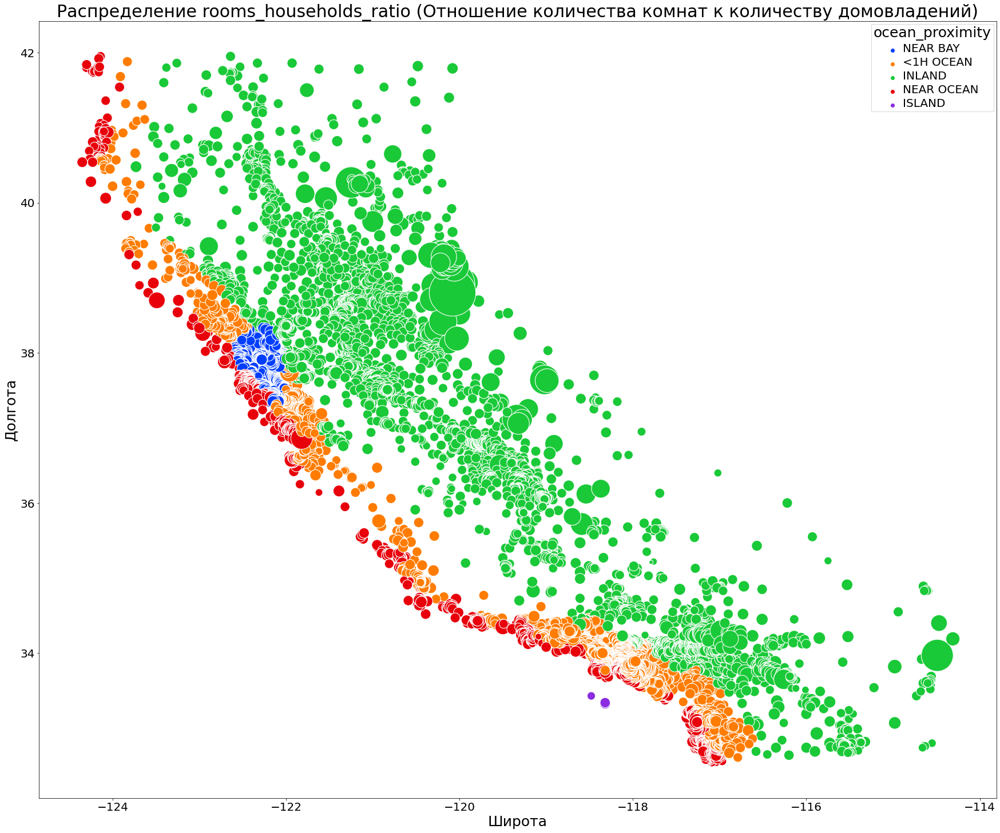

 ------------------------------------------------------------------------------------------------ 
 Поле : population_households_ratio - Отношение количества жителей к количеству домовладений 

count    20640.000000
mean         3.070655
std         10.386050
min          0.692308
25%          2.429741
50%          2.818116
75%          3.282261
max       1243.333333
Name: population_households_ratio, dtype: float64


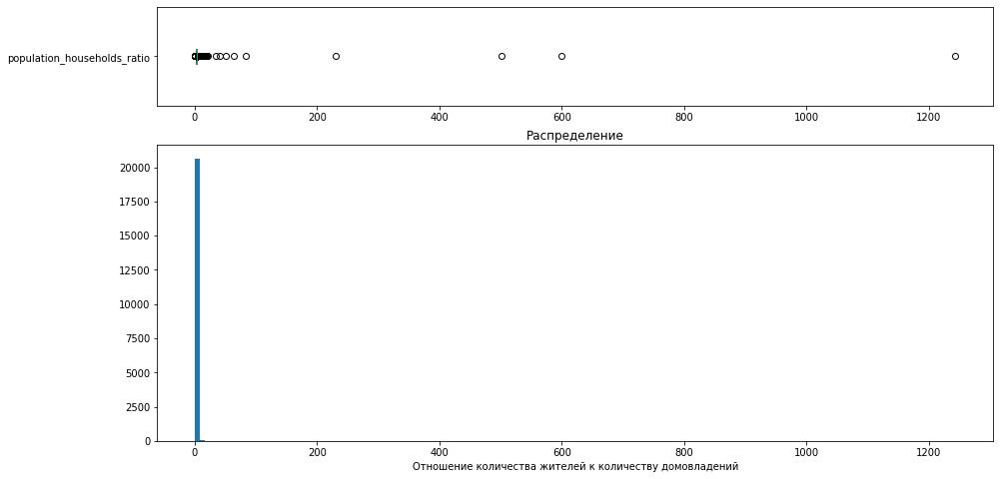

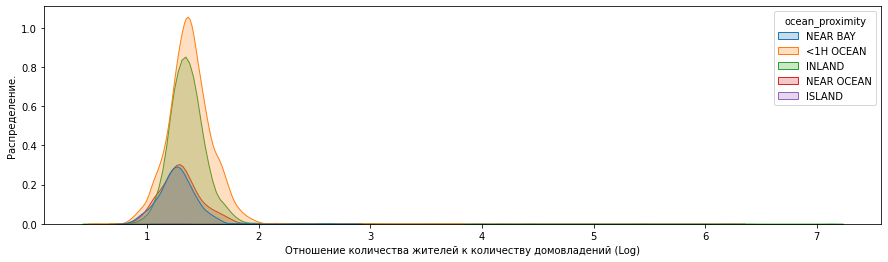

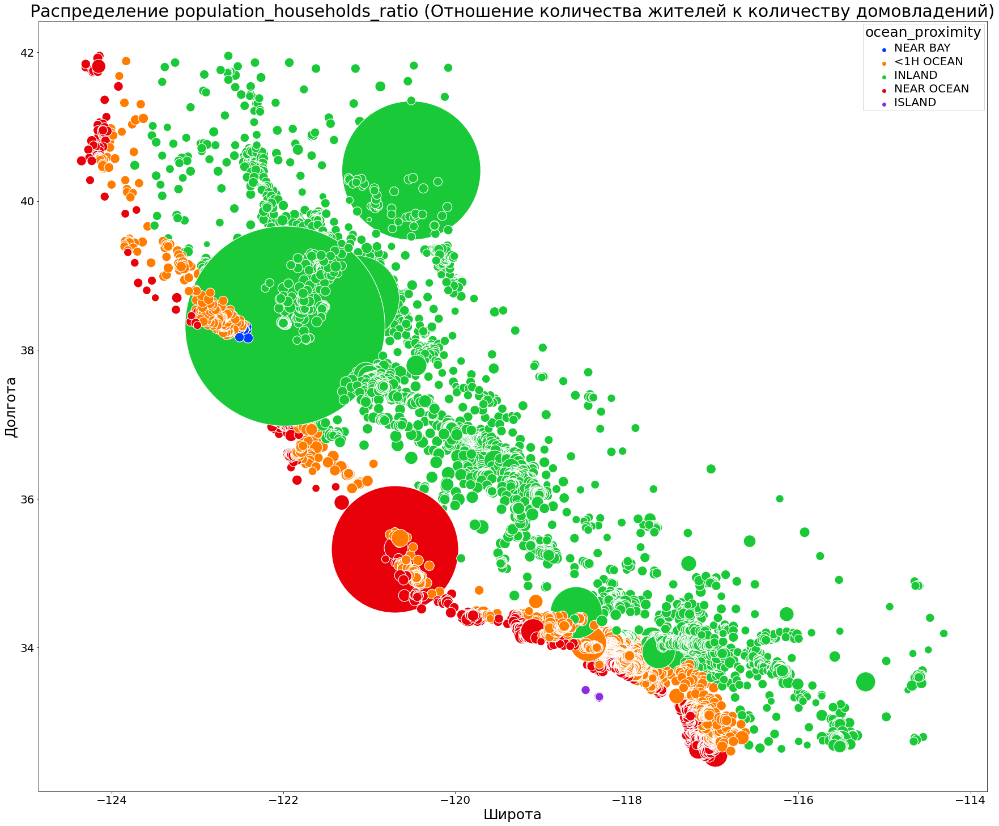

 ------------------------------------------------------------------------------------------------ 
 Поле : bedrooms_rooms_ratio - Отношение количества спален к общему количеству комнат 

count    20640.000000
mean         0.212948
std          0.057698
min          0.100000
25%          0.175708
50%          0.203715
75%          0.239273
max          1.000000
Name: bedrooms_rooms_ratio, dtype: float64


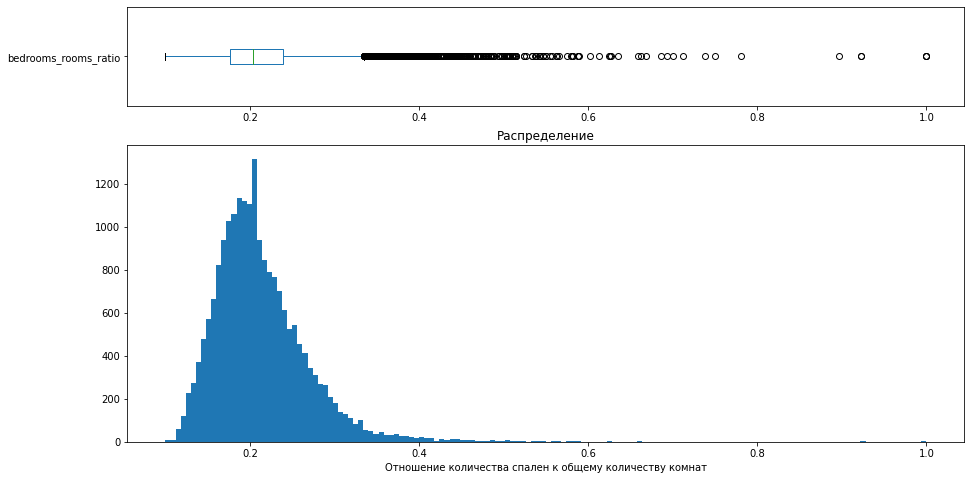

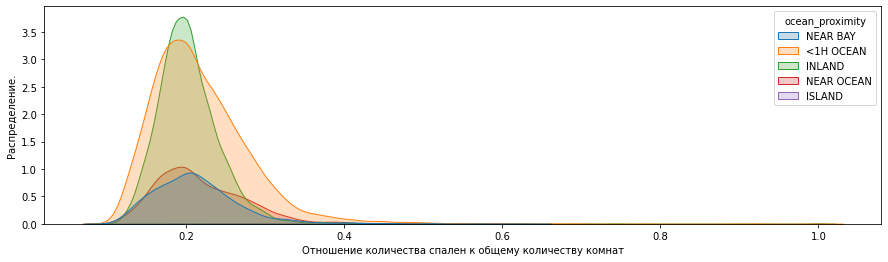

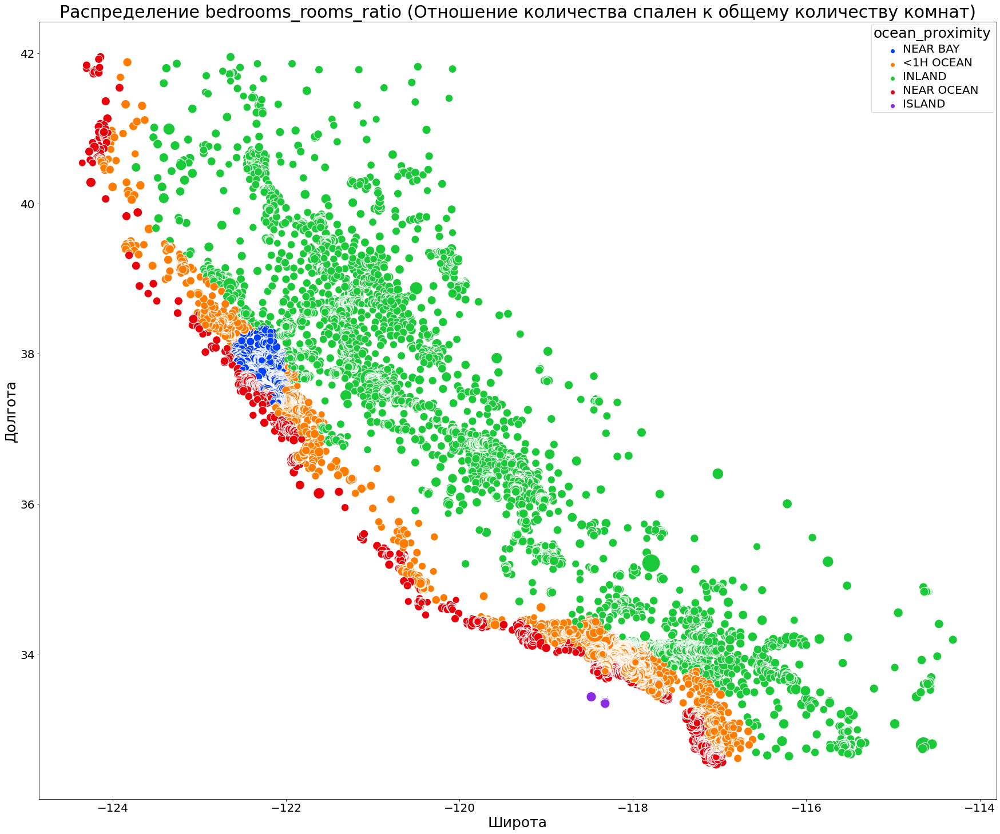

 ------------------------------------------------------------------------------------------------ 
 Поле : housing_median_age - медианный возраст домов 

count    20640.000000
mean        28.639486
std         12.585558
min          1.000000
25%         18.000000
50%         29.000000
75%         37.000000
max         52.000000
Name: housing_median_age, dtype: float64


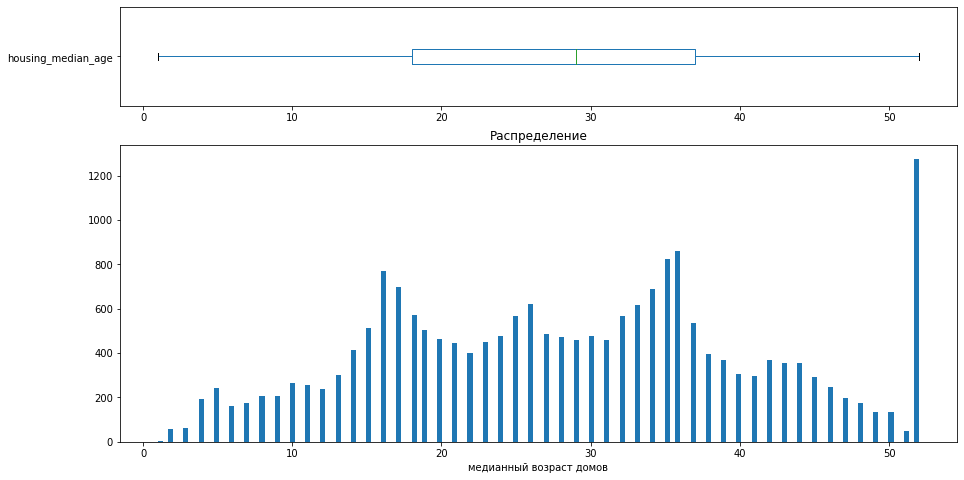

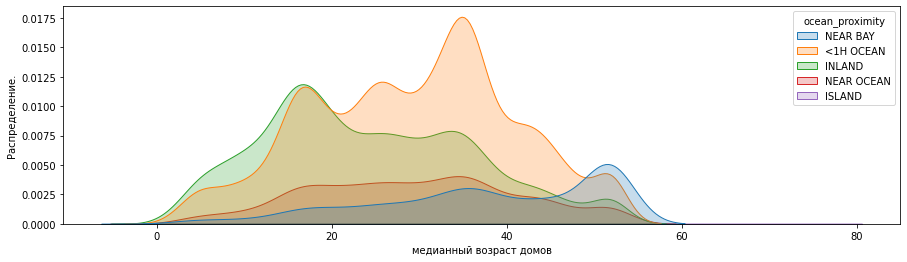

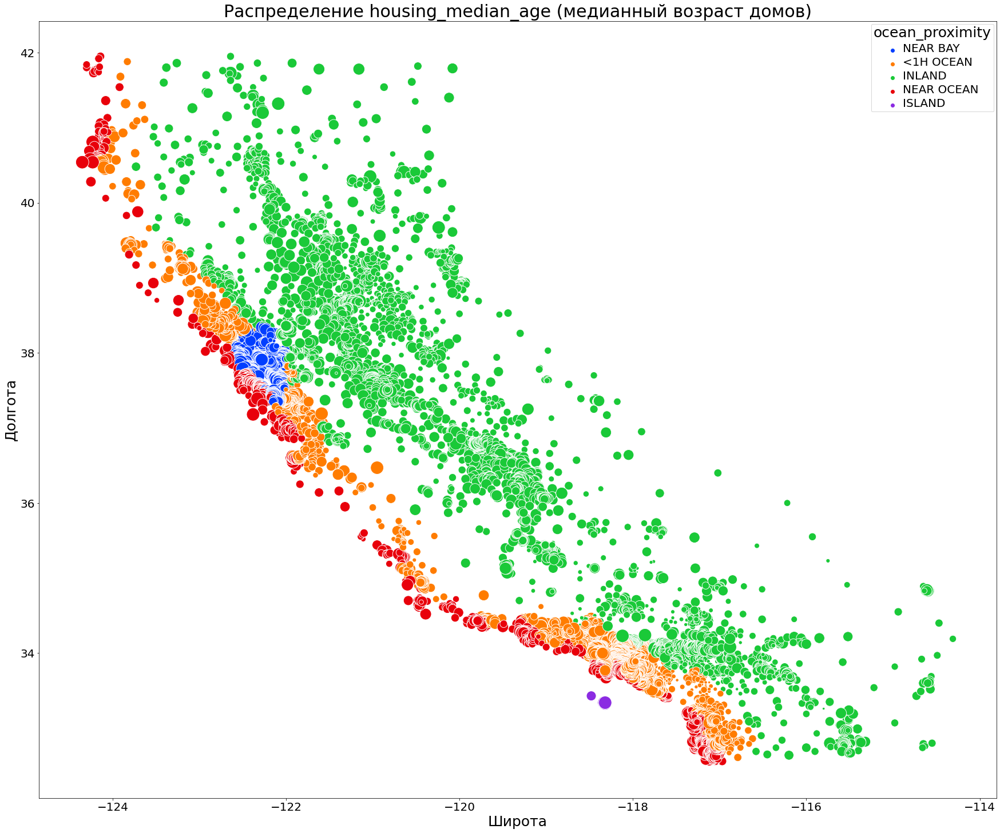

 ------------------------------------------------------------------------------------------------ 
 Поле : total_rooms - общее количество комнат в домах жилого массива 

count    20640.000000
mean      2635.763081
std       2181.615252
min          2.000000
25%       1447.750000
50%       2127.000000
75%       3148.000000
max      39320.000000
Name: total_rooms, dtype: float64


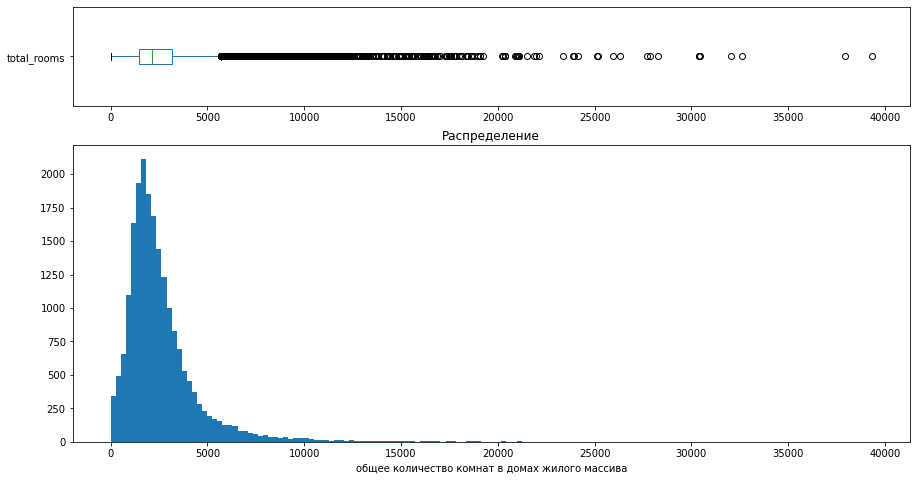

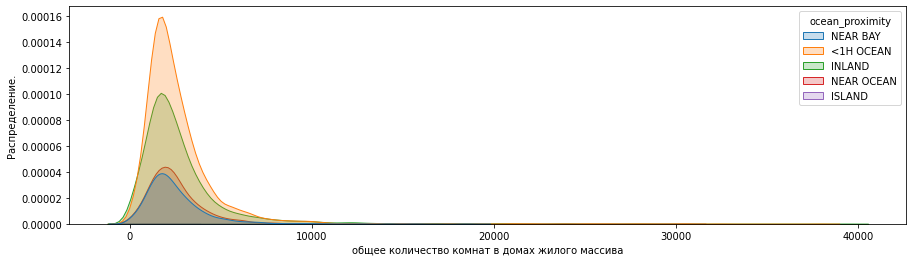

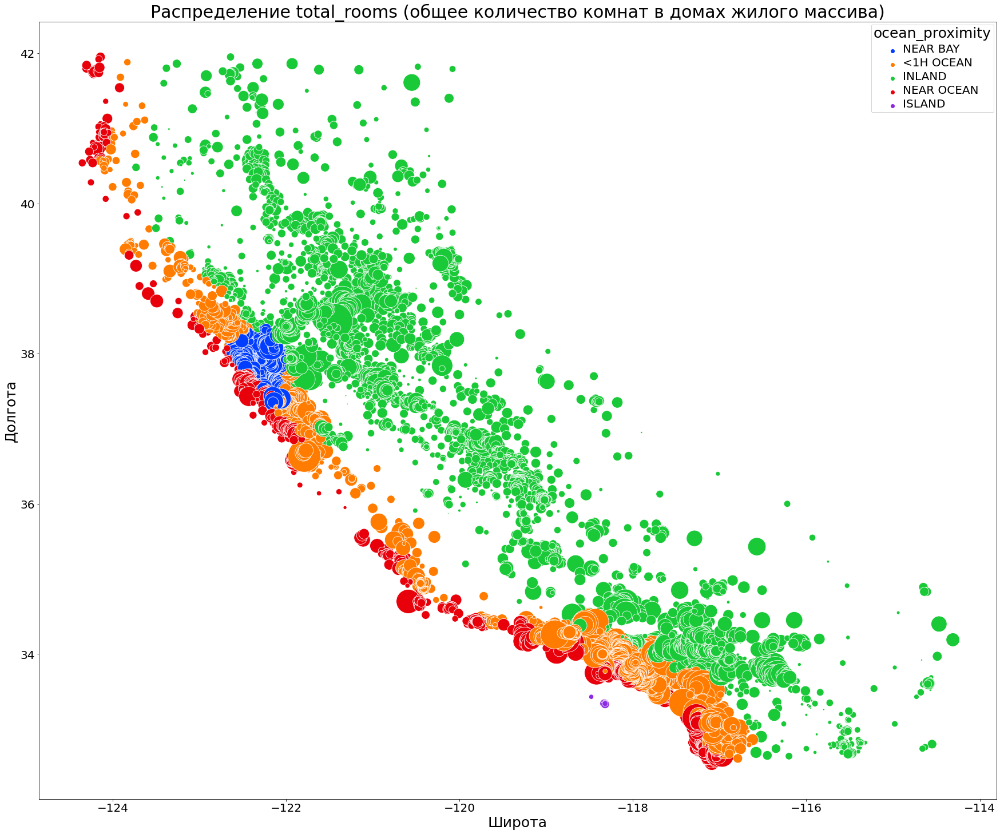

 ------------------------------------------------------------------------------------------------ 
 Поле : total_bedrooms_out - общее количество спален в домах жилого массива 

count    20640.000000
mean       537.719351
std        420.848774
min          1.000000
25%        295.000000
50%        435.000000
75%        647.000000
max       6445.000000
Name: total_bedrooms_out, dtype: float64


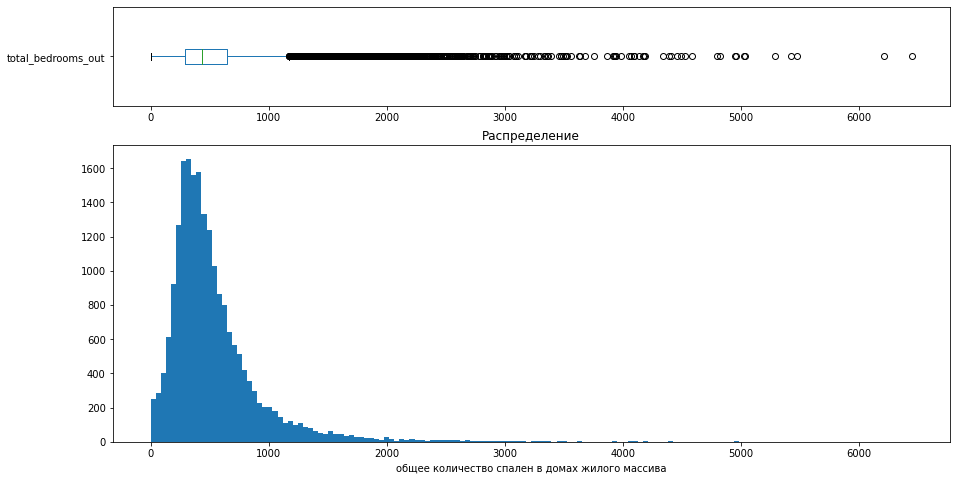

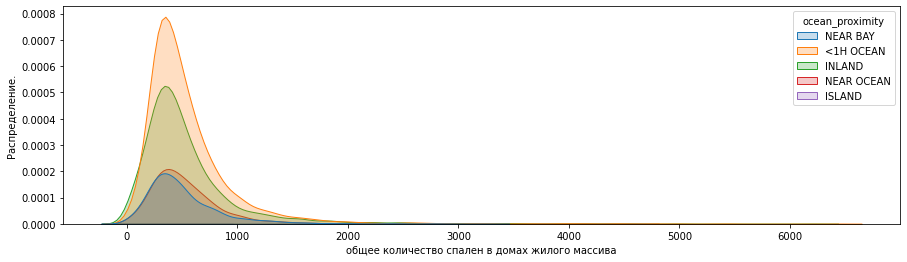

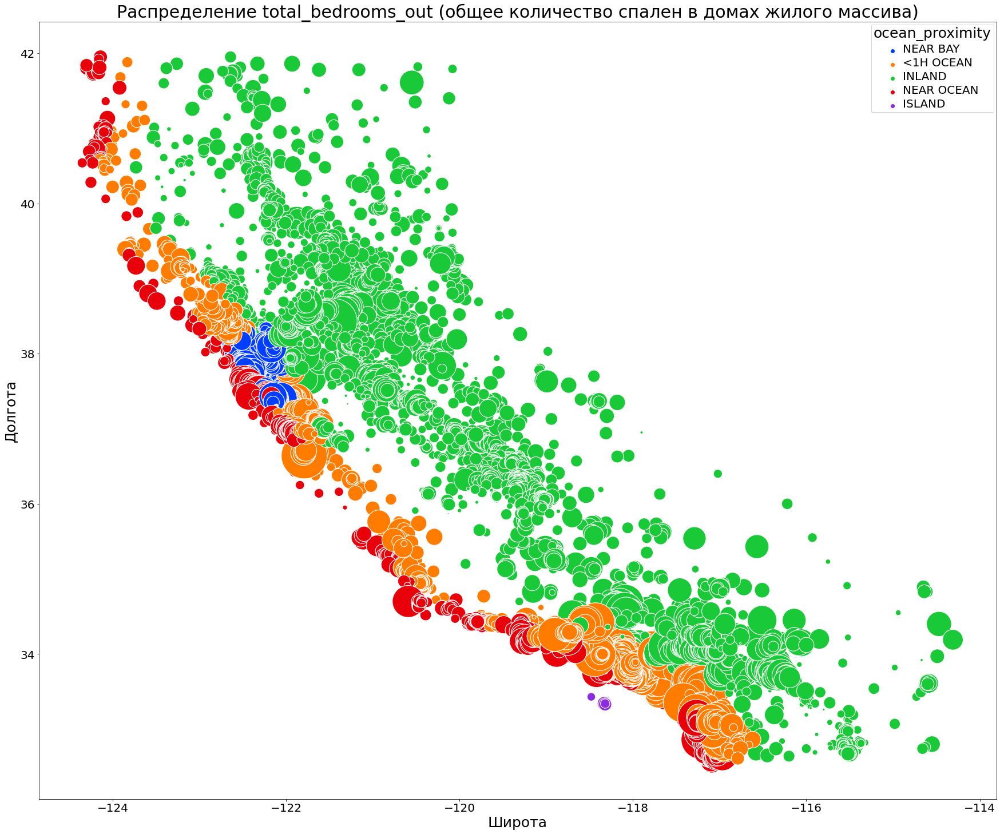

 ------------------------------------------------------------------------------------------------ 
 Поле : population - количество человек, которые проживают в жилом массиве 

count    20640.000000
mean      1425.476744
std       1132.462122
min          3.000000
25%        787.000000
50%       1166.000000
75%       1725.000000
max      35682.000000
Name: population, dtype: float64


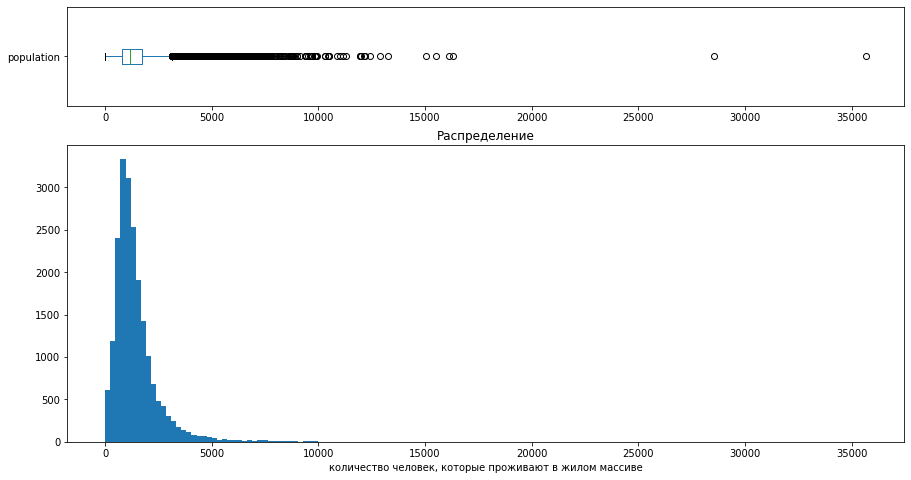

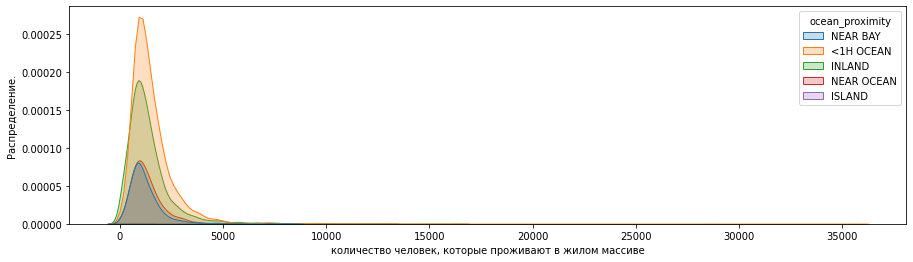

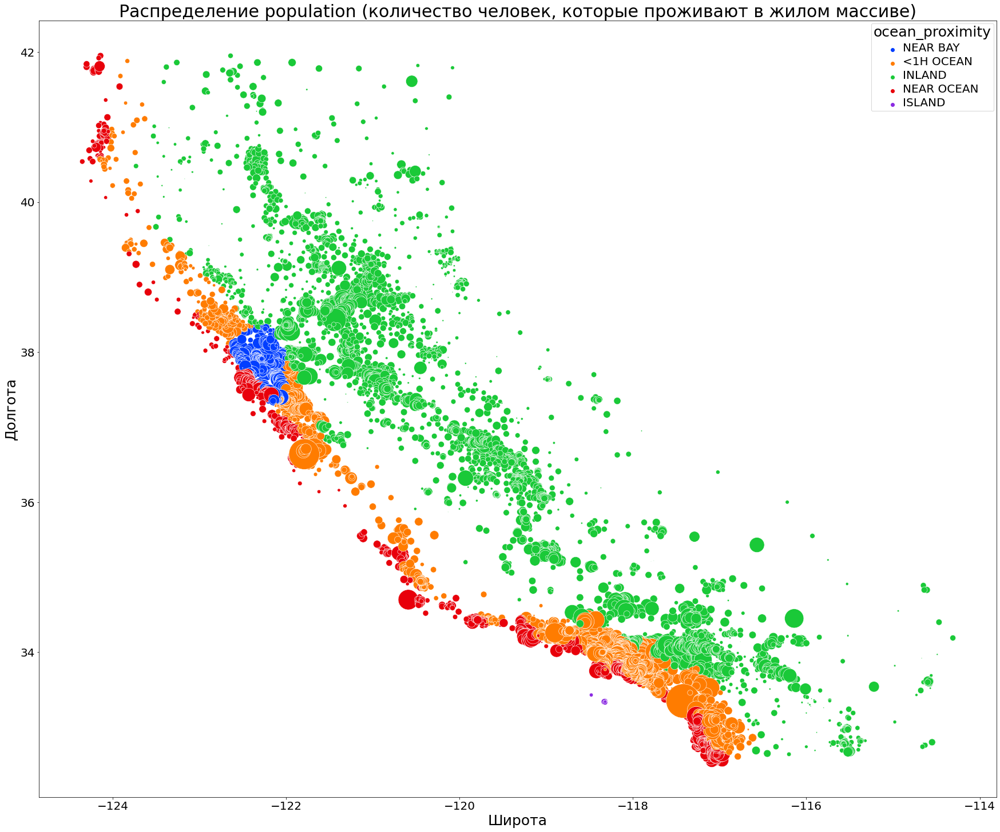

 ------------------------------------------------------------------------------------------------ 
 Поле : households - количество домовладений в жилом массиве 

count    20640.000000
mean       499.539680
std        382.329753
min          1.000000
25%        280.000000
50%        409.000000
75%        605.000000
max       6082.000000
Name: households, dtype: float64


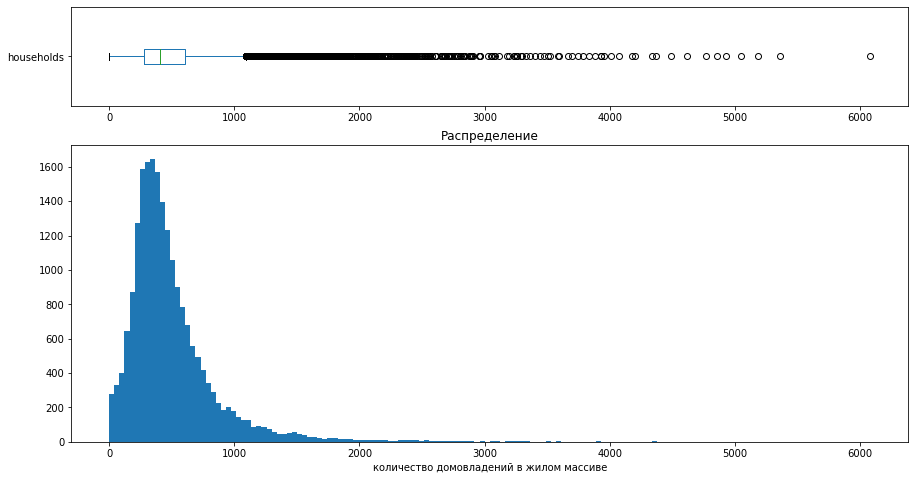

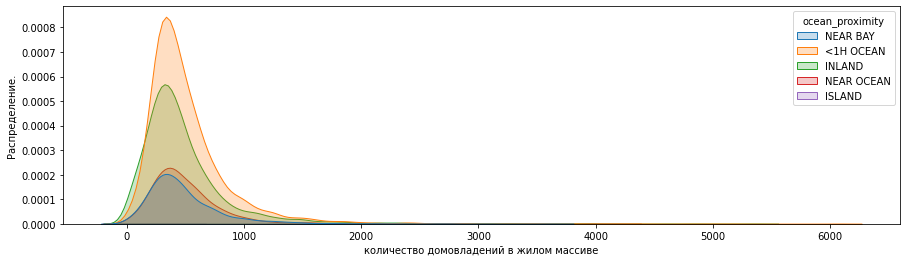

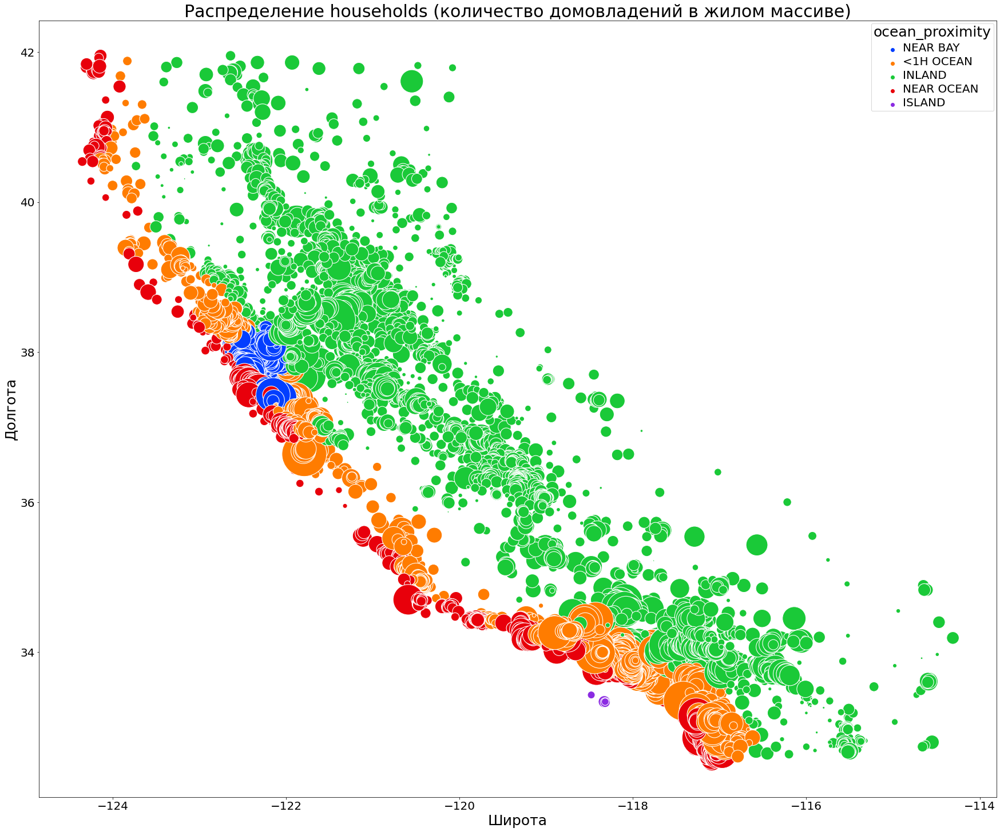

 ------------------------------------------------------------------------------------------------ 
 Поле : median_income - медианный доход жителей жилого массива 

count    20640.000000
mean         3.870671
std          1.899822
min          0.499900
25%          2.563400
50%          3.534800
75%          4.743250
max         15.000100
Name: median_income, dtype: float64


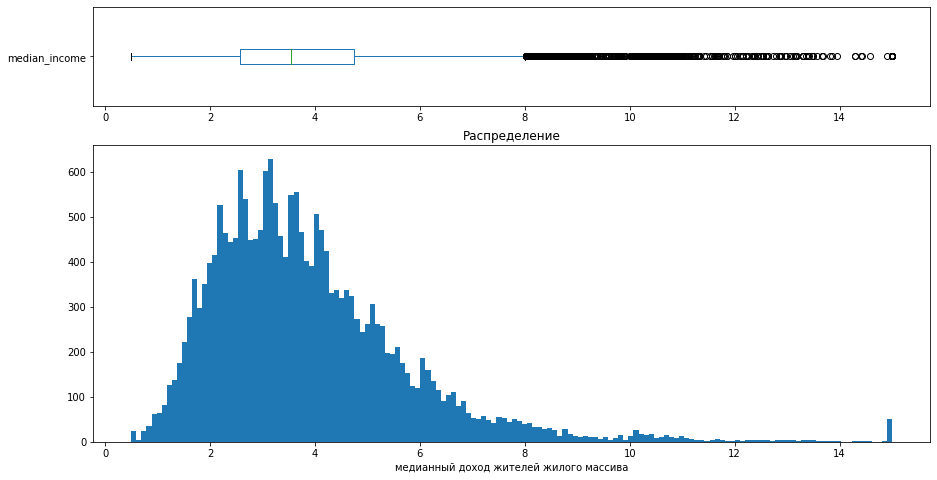

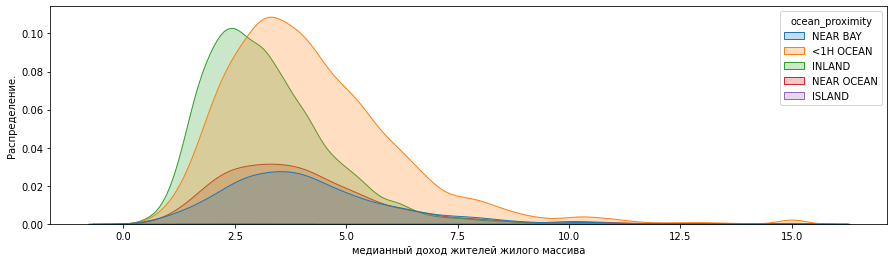

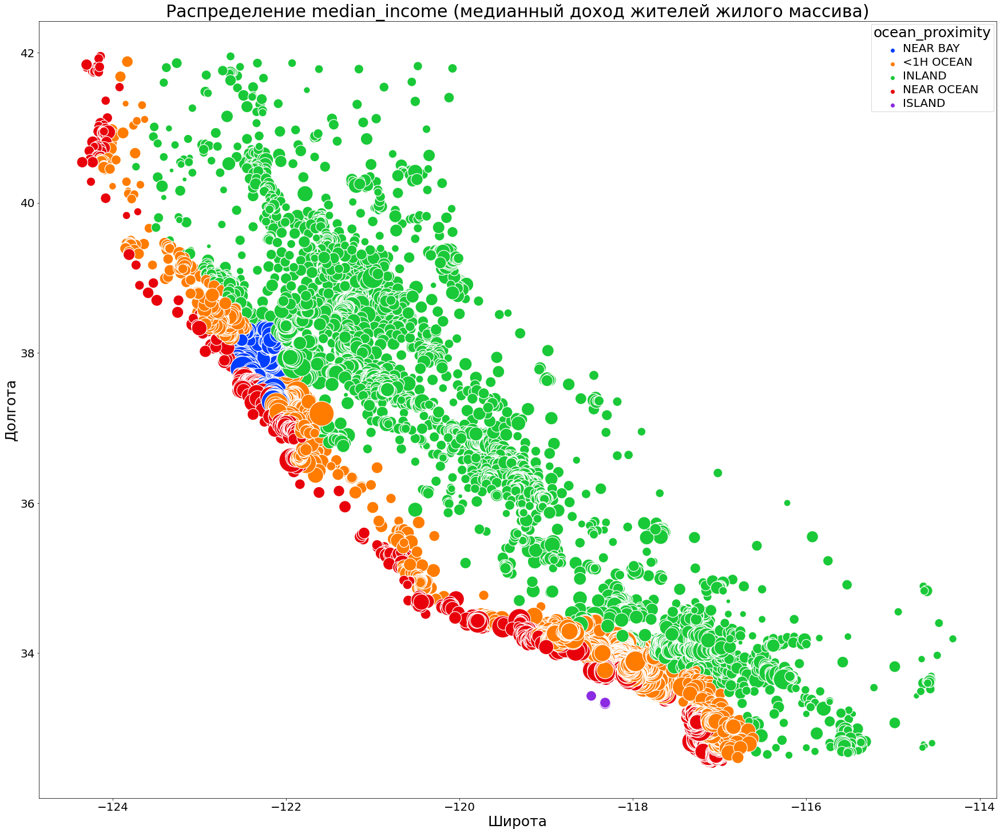

 ------------------------------------------------------------------------------------------------ 
 Поле : longitude - широта 

count    20640.000000
mean      -119.569704
std          2.003532
min       -124.350000
25%       -121.800000
50%       -118.490000
75%       -118.010000
max       -114.310000
Name: longitude, dtype: float64


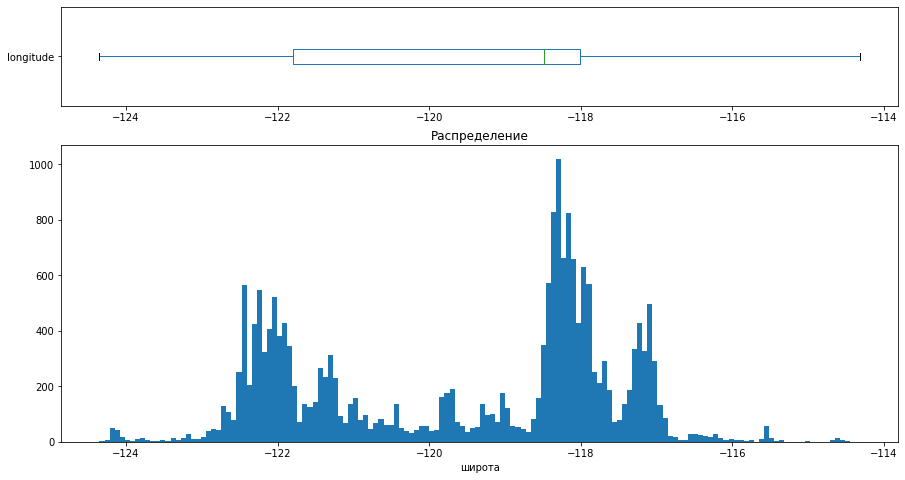

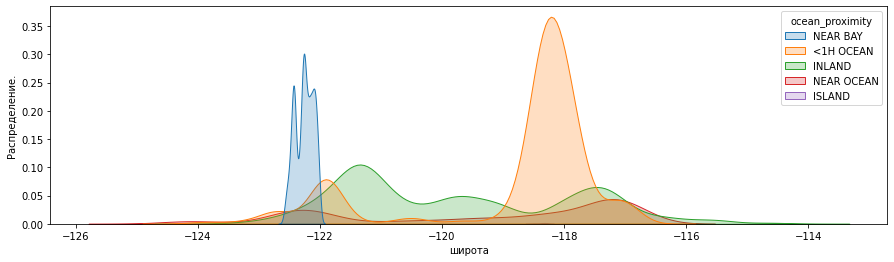

 ------------------------------------------------------------------------------------------------ 
 Поле : latitude - долгота 

count    20640.000000
mean        35.631861
std          2.135952
min         32.540000
25%         33.930000
50%         34.260000
75%         37.710000
max         41.950000
Name: latitude, dtype: float64


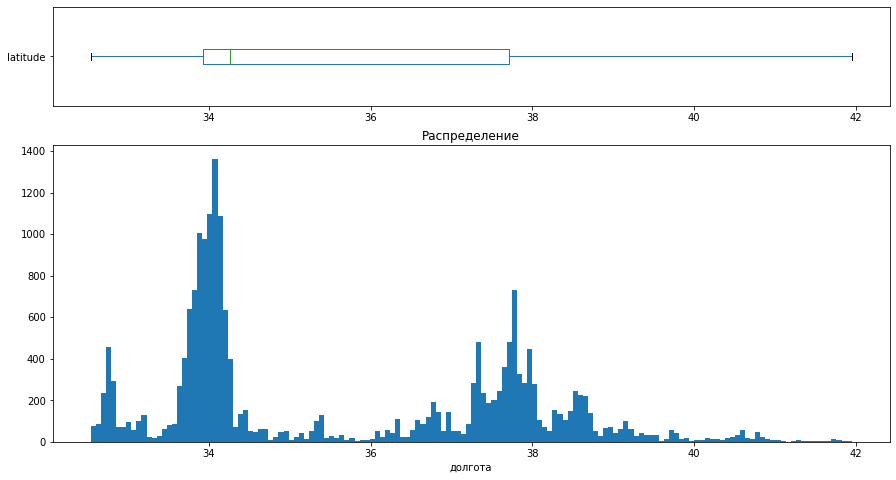

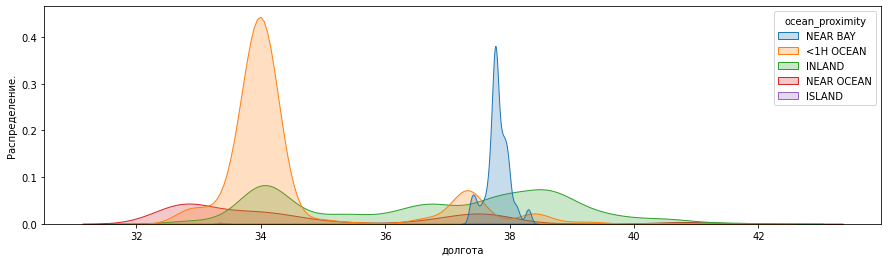

In [23]:
index = 0
for column in column_lst:
    column_analiser(
        analised_df,
        column,
#        x_label = column,
        x_label = title[index],
        y_label = '',
        print_unique = False,
        bins_= 150,
        figsize_ = (15, 8),
        height_ratios_ = [1, 3],
        hue_ = 'ocean_proximity',
        kde_plot_log_flag_ = kde_plot_log_flag[index],
        kde_plot_figsize_ = (15, 4),
        kde_plot_title = '',
        kde_plot_x_label = title[index],
        kde_plot_y_label = 'Распределение.',
        sns_point_size_coefficient_ = sns_point_size_coefficient[index]
)
    index += 1

### Удаление выбросов

In [24]:
print('Количество записей по выбросам:')
print('-------------------------------------------------------------------------------')
print(' ')

# display(df_housing.groupBy('ocean_proximity').count().toPandas())
print('population_households_ratio > 200 = ', df_housing.filter('population_households_ratio > 200').count())
print('population > 20000 = ', df_housing.filter('population > 20000').count())
print('rooms_households_ratio > 80 = ', df_housing.filter('rooms_households_ratio > 80').count())
print('households > 4000 = ', df_housing.filter('households > 4000').count())
print('total_rooms > 20000 = ', df_housing.filter('total_rooms > 20000').count())

Количество записей по выбросам:
-------------------------------------------------------------------------------
 
population_households_ratio > 200 =  4
population > 20000 =  2
rooms_households_ratio > 80 =  2
households > 4000 =  15
total_rooms > 20000 =  33


In [25]:
# df_housing = df_housing.filter('ocean_proximity != "ISLAND"')

df_housing = df_housing.filter('population_households_ratio < 200')
df_housing = df_housing.filter('population < 20000')
df_housing = df_housing.filter('rooms_households_ratio < 80')
df_housing = df_housing.filter('households < 4000')
df_housing = df_housing.filter('total_rooms < 20000')

analised_df = df_housing.toPandas()

### **Выводы**

* Анализ признака **Удаленность от океана** (`ocean_proximity`)
|Удаленность <br> от океана|Количество <br> записей| % записей|
|------|------|------|
|ISLAND|5| <1
|NEAR OCEAN|2652|13
|NEAR BAY|2290|11
|<1H OCEAN|9115|44
|INLAND|6534|32
* Числовые признаки
    * для числовых полей построены следующие графики:
        1. "Ящик с усами"
        2. Гистограмма распределения
        3. гистограмма распределения по признаку **Удаленность от океана**
        4. Распределение признака в разрезах **Широта** и **Долгота** (распределение по схематичной карте Калифорнии). Размеры точек пропорциональны значению признака.
    * были удалены записи с аномальными выбросами:
        1. `population_households_ratio < 200` - 4 записи
        2. `population < 20000` - 2 записи
        3. `rooms_households_ratio < 80` - 2 записи
        4. `households < 4000` - 15 записей
        5. `total_rooms < 20000` - 33 записи


## Корреляционный анализ

### Разделение на признаков на числовые, категориальные и целевые

In [26]:
num_columns = [
    'rooms_households_ratio',
    'population_households_ratio',
    'bedrooms_rooms_ratio',
    'longitude',
    'latitude',
    'housing_median_age',
    'total_rooms',
    'total_bedrooms_out', #'total_bedrooms',
    'population',
    'households',
    'median_income']

ohe_columns = 'ocean_proximity'
target_column = 'median_house_value'

display(df_housing.describe(num_columns).toPandas())

,summary,rooms_households_ratio,population_households_ratio,bedrooms_rooms_ratio,longitude,latitude,housing_median_age,total_rooms,total_bedrooms_out,population,households,median_income
0,count,20596,20596,20596,20596,20596,20596,20596,20596,20596,20596,20596
1,mean,5.4142411222470415,2.946482658544381,0.21300308326527104,-119.5710434064836,35.63251019615476,28.674985434064865,2596.607156729462,530.84343572358,1405.933433676442,493.4351330355409,3.868540357350992
2,stddev,2.10679590606977,1.2224206962014352,0.05771654505102941,2.003795598130356,2.1358659670321978,12.562039010749057,1964.171222583318,387.0259423048529,1016.5342656153157,352.1324762255085,1.8996844543237343
3,min,0.8461538461538461,0.6923076923076923,0.1,-124.35,32.54,1.0,2.0,1.0,3.0,1.0,0.4999
4,max,62.422222222222224,83.17142857142858,1.0,-114.31,41.95,52.0,19107.0,4183.0,12427.0,3832.0,15.0001


### Тепловая карта корреляции

24/10/31 09:13:39 WARN BLAS: Failed to load implementation from: com.github.fommil.netlib.NativeSystemBLAS
24/10/31 09:13:39 WARN BLAS: Failed to load implementation from: com.github.fommil.netlib.NativeRefBLAS


<Figure size 432x288 with 0 Axes>

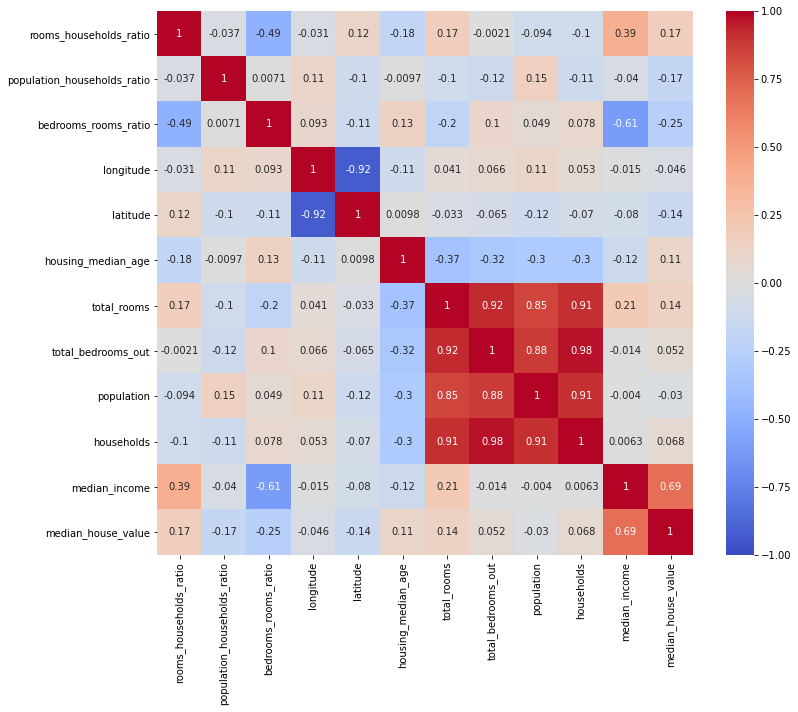

In [27]:
heatmap_draw(df_ = df_housing, num_columns_ = num_columns, target_column_ = target_column)

### Удаление зависимых признаков

In [28]:
#num_columns.remove('longitude')
#num_columns.remove('latitude')
num_columns.remove('households')
num_columns.remove('total_rooms')

In [29]:
# Финальный набор числовых признаков для обучения модели
print('------------------------------------------------------------------------')
print('Финальный набор числовых признаков для обучения модели')
print('------------------------------------------------------------------------')
display(num_columns)
print('------------------------------------------------------------------------')
print('Финальный набор числовых признаков для обучения модели')
print('------------------------------------------------------------------------')
display(ohe_columns)
print('------------------------------------------------------------------------')
print('Целевой признак')
print('------------------------------------------------------------------------')
display(target_column)

------------------------------------------------------------------------
Финальный набор числовых признаков для обучения модели
------------------------------------------------------------------------


['rooms_households_ratio',
 'population_households_ratio',
 'bedrooms_rooms_ratio',
 'longitude',
 'latitude',
 'housing_median_age',
 'total_bedrooms_out',
 'population',
 'median_income']

------------------------------------------------------------------------
Финальный набор числовых признаков для обучения модели
------------------------------------------------------------------------


'ocean_proximity'

------------------------------------------------------------------------
Целевой признак
------------------------------------------------------------------------


'median_house_value'

### Тепловая карта корреляции без зависимых признаков

<Figure size 432x288 with 0 Axes>

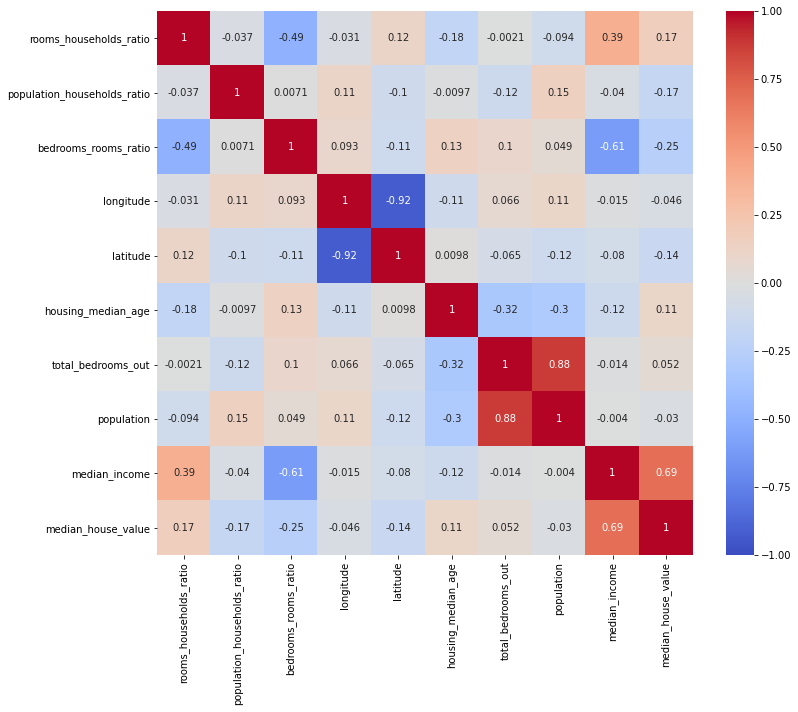

In [30]:
heatmap_draw(df_ = df_housing, num_columns_ = num_columns, target_column_ = target_column)

### **Выводы**

* Обнаружена **Мультиколлинеарность** (показатель > 0.9). Зависимые признаки:
    * `households`
    * `total_rooms`
    * `total_bedrooms_out`
    * `population`
* **Мультиколлинеарность исключена** после удаление из списка следующих признаков:
    * `households`
    * `total_rooms`
* Обнаружена зависимость = 0.69 между `median_income` и целевым признаком `median_house_value`

## Трансформация и кодирование данных

### Разделение на выборки

In [31]:
train_df, test_df = df_housing.randomSplit([0.8, 0.2], seed = RANDOM_SEED)

In [32]:
print('---------------------------------------------------------------')
print('Количество записей тренировочной выборки : ', train_df.count())
display(pd.DataFrame(train_df.take(2), columns = train_df.columns))
print('---------------------------------------------------------------')
print('Количество записей тестовой выборки      : ', test_df.count())
display(pd.DataFrame(test_df.take(2), columns = test_df.columns))

---------------------------------------------------------------


Количество записей тренировочной выборки :  16382


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_out,rooms_households_ratio,population_households_ratio,bedrooms_rooms_ratio
0,-124.35,40.54,52.0,1820.0,300.0,806.0,270.0,3.0147,94600.0,NEAR OCEAN,300.0,6.740741,2.985185,0.164835
1,-124.30,41.80,19.0,2672.0,552.0,1298.0,478.0,1.9797,85800.0,NEAR OCEAN,552.0,5.589958,2.715481,0.206587


---------------------------------------------------------------
Количество записей тестовой выборки      :  4214


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_bedrooms_out,rooms_households_ratio,population_households_ratio,bedrooms_rooms_ratio
0,-124.30,41.84,17.0,2677.0,531.0,1244.0,456.0,3.0313,103600.0,NEAR OCEAN,531.0,5.870614,2.728070,0.198356
1,-124.23,40.81,52.0,1112.0,209.0,544.0,172.0,3.3462,50800.0,NEAR OCEAN,209.0,6.465116,3.162791,0.187950


### Кодирование категориальных признаков

In [ ]:
# Обучающая выборка
train_df = cat_column_coder(
    df_ = train_df,
    inputCol_ = 'ocean_proximity',
    output_Col_index_ = 'ocean_proximity_index',
    output_Col_ohe_ = 'ocean_proximity_ohe')

# Тестовая выборка
test_df = cat_column_coder(
    df_ = test_df,
    inputCol_ = 'ocean_proximity',
    output_Col_index_ = 'ocean_proximity_index',
    output_Col_ohe_ = 'ocean_proximity_ohe')

### Кодирование числовых признаков

In [ ]:
# Обучающая выборка
train_df = num_column_coder(
    df_ = train_df,
    num_columns_ = num_columns,
    output_col_ = 'num_features',
    output_col_scaled_ = 'num_features_scaled')

# Тестовая выборка
test_df = num_column_coder(
    df_ = test_df,
    num_columns_ = num_columns,
    output_col_ = 'num_features',
    output_col_scaled_ = 'num_features_scaled')

### Формирование общего вектора признаков

In [ ]:
# Обучающая выборка
all_features = ['categorical_features', 'num_features_scaled']
final_assembler = VectorAssembler(
    inputCols = all_features,
    outputCol = 'all_features') 

train_df = final_assembler.transform(train_df)

# Тестовая выборка
all_features = ['categorical_features', 'num_features_scaled']
final_assembler = VectorAssembler(
    inputCols = all_features,
    outputCol = 'all_features') 

test_df = final_assembler.transform(test_df)

### **Выводы**

* Если я не ошибаюсь, то кодирование и масштабирование признаков реализуется после формирования тренировочной и  тестовой выборок.
* В этом проекте, при кодировании признаков и формировании векторов **после разделения** на тренеровочную и тестовую выборки, **получал ошибки** при расчете метрик, или отображении прогнозов. При этом `predictions = model.transform(test_df)` выполняется без ошибок. 
* Ошибку не победил, в процессе...

## Обучение модели

In [34]:
# Словарь тренировочного и обучающего датасетов 
split_dic = {'train_df' : train_df, 'test_df' : test_df}

# Датасет с метриками по тренеровочной и тестовой выборкам в разрезе наборы входящих признаков:
# - только числовые признаки
# - все признаки
metrics_df = [
    ['split_type', 'feature_type', 'RMSE', 'MAE', 'R2']
]

# Обучение модели на тренеровочной базе по всем признакам и толлько по числовым
for features_type in ['all_features', 'num_features_scaled']:
    # обучение модели
    lr = LinearRegression(featuresCol = features_type, labelCol = target_column)
    model = lr.fit(train_df)

    for key in split_dic.keys():
        #display(split_dic[key].toPandas().head(3))
        print('-------------------------------------------------------------------------------------------------------')
        print(key, ' - ', features_type)
        print(' ')
        predictions = model.transform(split_dic[key])

        metrics = RegressionMetrics(predictions.select(['prediction', target_column]).rdd)

#        display(predictions.toPandas())

        print("RMSE: {0}".format(metrics.rootMeanSquaredError))
        print("MAE : {0}".format(metrics.meanAbsoluteError))
        print("R2  : {0}".format(metrics.r2))
    
        metrics_df.append([
            key,
            features_type,
            metrics.rootMeanSquaredError,
            metrics.meanAbsoluteError,
            metrics.r2
        ])

24/10/31 09:14:00 WARN Instrumentation: [19812097] regParam is zero, which might cause numerical instability and overfitting.
24/10/31 09:14:01 WARN LAPACK: Failed to load implementation from: com.github.fommil.netlib.NativeSystemLAPACK
24/10/31 09:14:01 WARN LAPACK: Failed to load implementation from: com.github.fommil.netlib.NativeRefLAPACK


-------------------------------------------------------------------------------------------------------
train_df  -  all_features
 


RMSE: 67729.21721303077
MAE : 48869.9377425616
R2  : 0.655172288645613
-------------------------------------------------------------------------------------------------------
test_df  -  all_features
 
RMSE: 70789.61855815968
MAE : 55309.84099977713
R2  : 0.6255478840273612


24/10/31 09:14:08 WARN Instrumentation: [90f41dcd] regParam is zero, which might cause numerical instability and overfitting.


-------------------------------------------------------------------------------------------------------
train_df  -  num_features_scaled
 


RMSE: 68418.14646052863
MAE : 49624.836609215665
R2  : 0.6481215615394265
-------------------------------------------------------------------------------------------------------
test_df  -  num_features_scaled
 
RMSE: 76241.78973992959
MAE : 62194.351749822716
R2  : 0.5656465154897152


## Анализ результатов

In [35]:
pd.DataFrame(metrics_df[1:], columns = metrics_df[0]).sort_values(by='feature_type', ascending=False)

,split_type,feature_type,RMSE,MAE,R2
2,train_df,num_features_scaled,68418.146461,49624.836609,0.648122
3,test_df,num_features_scaled,76241.789740,62194.351750,0.565647
0,train_df,all_features,67729.217213,48869.937743,0.655172
1,test_df,all_features,70789.618558,55309.841000,0.625548


### Прогноз по тестовой выборке с лучшим показателем `R2 - all_features`

### Формирование прогноза по тестовой выборке по всем отобранным признакам

In [36]:
lr = LinearRegression(featuresCol = 'all_features', labelCol = target_column)
model = lr.fit(train_df)
predictions = model.transform(test_df)

# Формирование значений остатков
predictions = predictions.withColumn('residuals_abs', F.abs(F.col('prediction') - F.col('median_house_value')))
predictions = predictions.withColumn('residuals', F.col('prediction') - F.col('median_house_value'))

24/10/31 09:14:12 WARN Instrumentation: [f94a44c5] regParam is zero, which might cause numerical instability and overfitting.


 ------------------------------------------------------------------------------------------------ 
 Поле : residuals - Остатки 

count      4214.000000
mean      22336.580239
std       67181.234793
min     -443558.077037
25%       -5619.191181
50%       31446.123002
75%       63535.376799
max      325044.047863
Name: residuals, dtype: float64


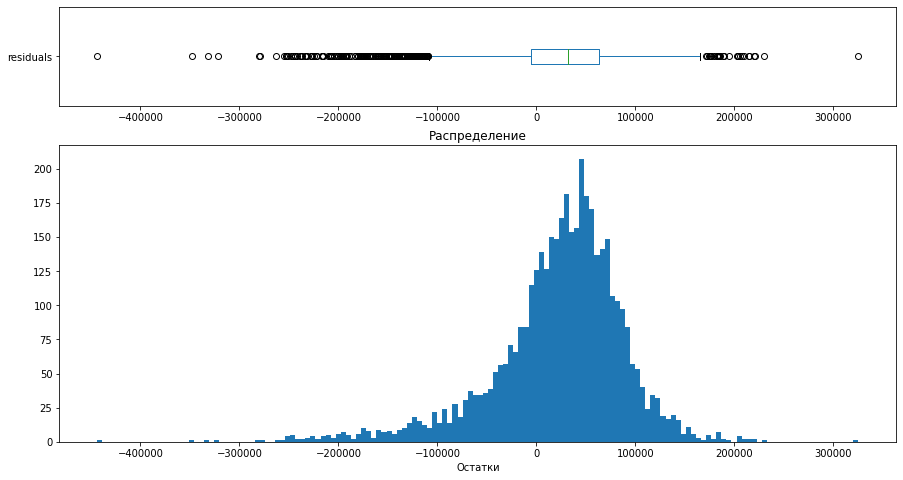

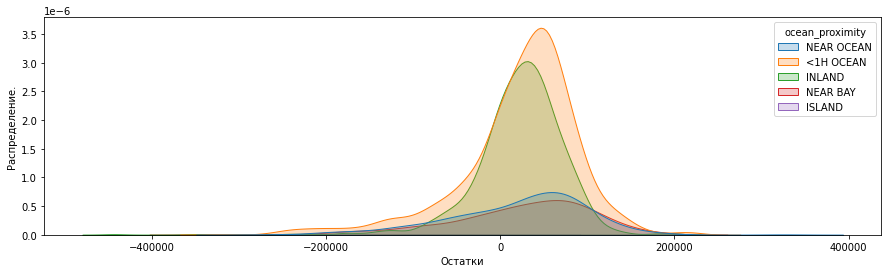

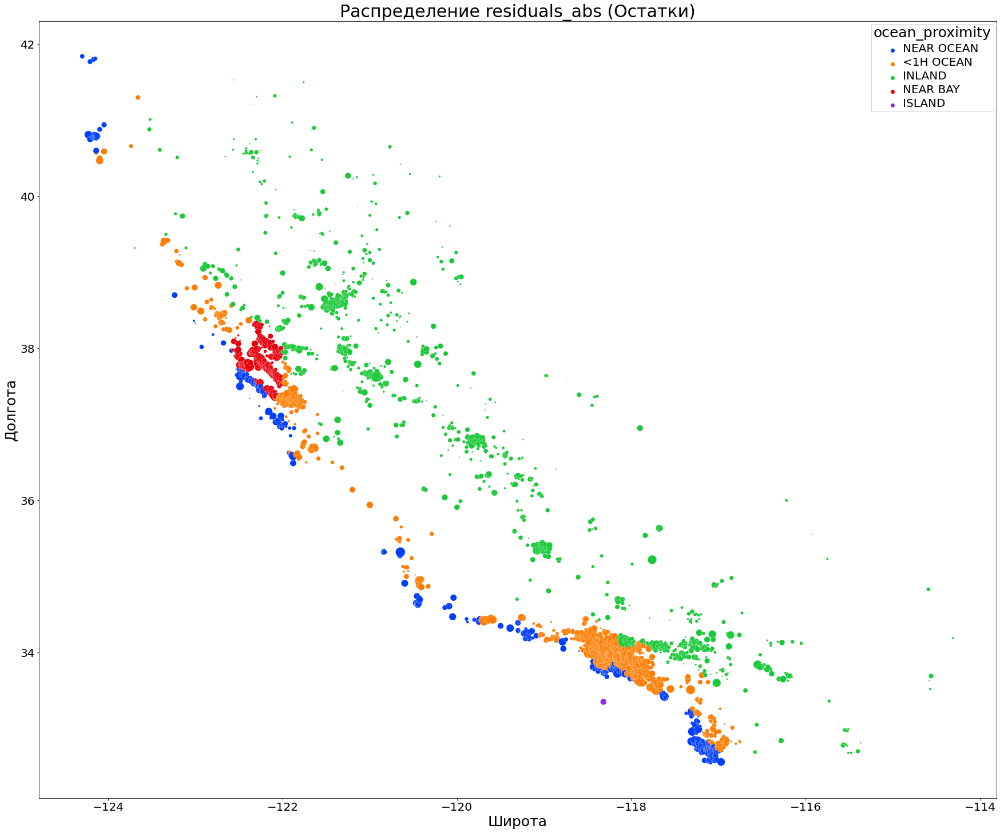

In [37]:
column_lst = ['residuals']

title = ['Остатки']

kde_plot_log_flag = [False]

sns_point_size_coefficient = [1000]

index = 0
for column in column_lst:
    column_analiser(
        predictions.toPandas(),
        column,
#        x_label = column,
        x_label = title[index],
        y_label = '',
        print_unique = False,
        bins_= 150,
        figsize_ = (15, 8),
        height_ratios_ = [1, 3],
        hue_ = 'ocean_proximity',
        kde_plot_log_flag_ = kde_plot_log_flag[index],
        kde_plot_figsize_ = (15, 4),
        kde_plot_title = '',
        kde_plot_x_label = title[index],
        kde_plot_y_label = 'Распределение.',
        sns_point_size_coefficient_ = sns_point_size_coefficient[index],
        column_abs_ = 'residuals_abs'
)
    index += 1

### Завершение сессии

### **Выводы**

* Результаты обечения модели по всем признакам и только по числовым признакам:
|split_type|feature_type|RMSE|MAE|R2|
|----------|----------|----------|--------|------|
|train_df|num_features_scaled|68418.146461|49624.836610|0.648122|
|test_df|num_features_scaled|68074.646536|49448.220339|0.653720|
|train_df|all_features|67729.217213|48869.937744|0.655172|
|test_df|all_features|67340.165237|48627.422147|0.661152|
* Значения метрик модели, построенной на числовых и категориальном признаках лучьше, но не отличаются принципиально от показателей модели, построенной только на числовых признаках.
* Модель ошибайтся как в большую, так и менюшую сторону примерно одинаково.
* Большее количество ошибок в прогнозах обнаружено для жилья, расположенного в зонах `<1H OCEAN` и `INLAND`